# Playground
This is an experimentation space for learning PlantCV and understanding how to detect plants. For the full workflow view main.py.

In [14]:
from plantcv import plantcv as pcv
import matplotlib

In [120]:
class options:
    def __init__(self):
        self.image = "./seedling_imgs/top_1.jpg"
        self.debug = "plot"
        self.writeimg= False
        self.result = "vis_tutorial_results.json"
        self.outdir = "." # Store the output to the current directory

# Get options
args = options()

# Set debug to the global parameter 
pcv.params.debug = args.debug

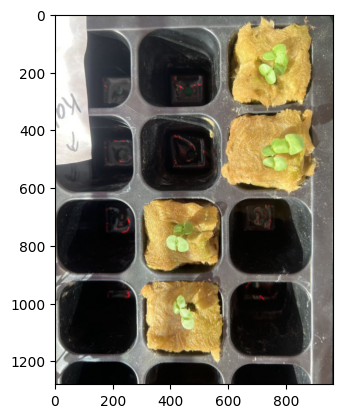

In [123]:
img, path, filename = pcv.readimage(filename=args.image)

In [21]:
img.shape

(1280, 962, 3)

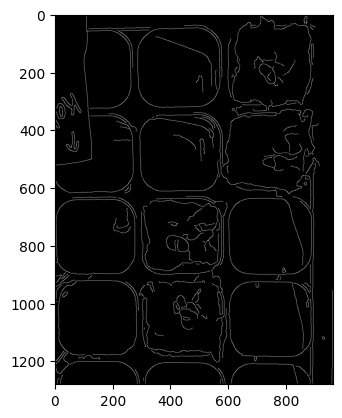

In [22]:
edges = pcv.canny_edge_detect(img, sigma=3)

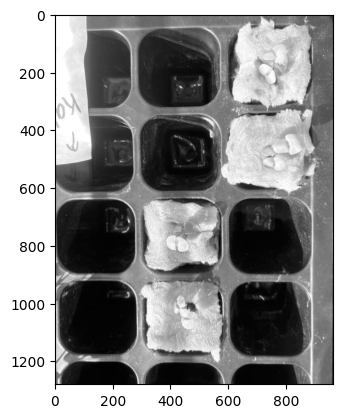

array([[255, 255, 255, ...,  58,  59,  60],
       [255, 255, 255, ...,  58,  60,  60],
       [255, 255, 255, ...,  58,  60,  60],
       ...,
       [ 93,  95,  98, ...,  42,  45,  45],
       [ 91,  93,  97, ...,  43,  45,  45],
       [ 90,  92,  97, ...,  46,  46,  46]], dtype=uint8)

In [23]:
pcv.rgb2gray_hsv(rgb_img=img, channel="v")

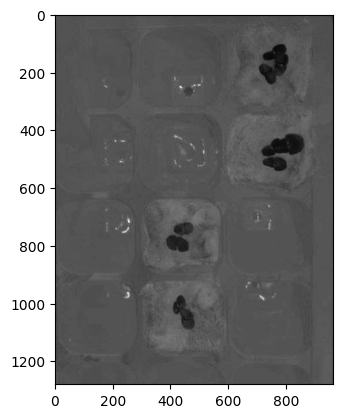

In [24]:
#   channel- Split by 'l' (lightness), 'a' (green-magenta), or 'b' (blue-yellow) channel
a = pcv.rgb2gray_lab(rgb_img=img, channel='a')


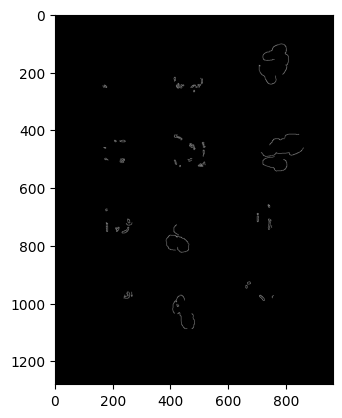

In [25]:
edges = pcv.canny_edge_detect(a, sigma=0.5)

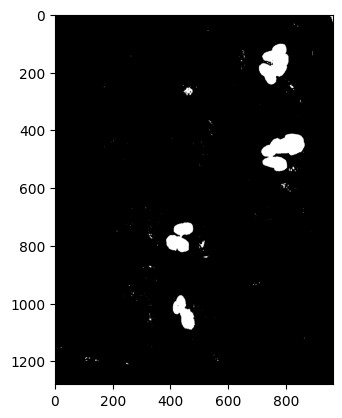

In [26]:
a_thresh = pcv.threshold.binary(gray_img=a, threshold=120, max_value=255, 
                                object_type='dark')

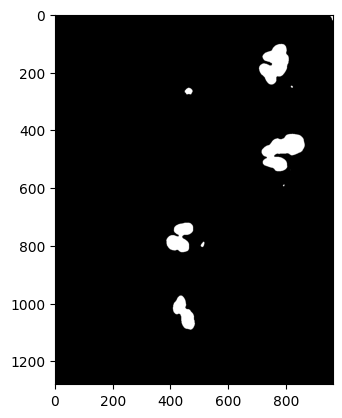

In [27]:
s_mblur = pcv.median_blur(gray_img=a_thresh, ksize=10)

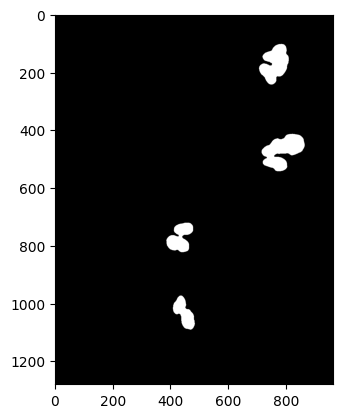

In [28]:
fill_image = pcv.fill(bin_img=s_mblur, size=1000)

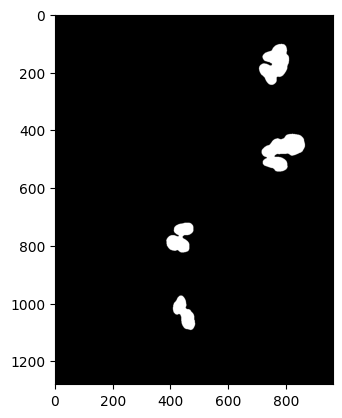

In [54]:
# https://www.cs.auckland.ac.nz/courses/compsci773s1c/lectures/ImageProcessing-html/topic4.htm
dilated = pcv.dilate(gray_img=fill_image, ksize=2, i=1)


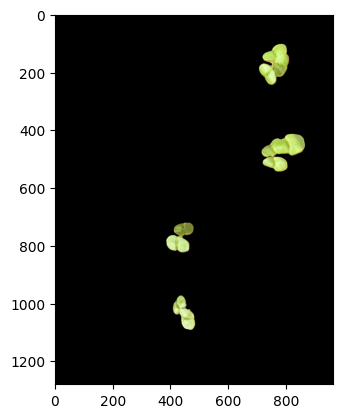

In [59]:
masked = pcv.apply_mask(img=img, mask=dilated, mask_color='black')


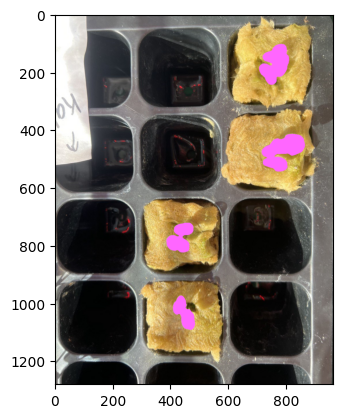

In [60]:
id_objects, obj_hierarchy = pcv.find_objects(img=img, mask=dilated)

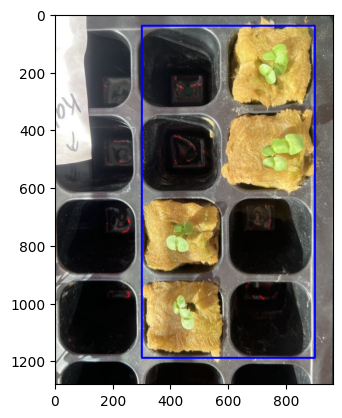

In [61]:
roi_contour, roi_hierarchy = pcv.roi.rectangle(img=img, x=300, y=40, h=1150, w=600)


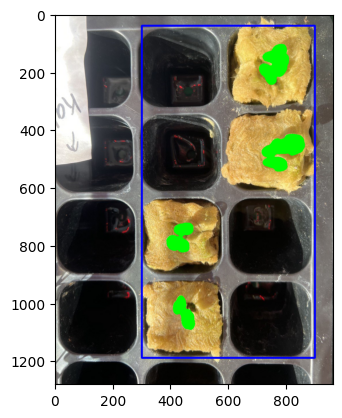

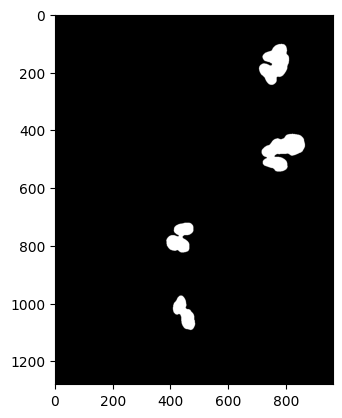

In [62]:
roi_objects, roi_obj_hierarchy, kept_mask, obj_area = pcv.roi_objects(img=img, roi_contour=roi_contour, 
                                                                      roi_hierarchy=roi_hierarchy,
                                                                      object_contour=id_objects, 
                                                                      obj_hierarchy=obj_hierarchy, 
                                                                      roi_type='partial')

In [63]:
in_bounds = pcv.within_frame(mask=kept_mask, label="default")


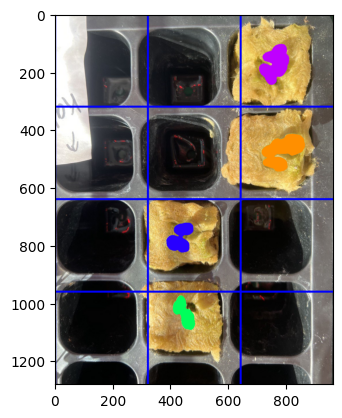

In [64]:
clusters_i, contours, hierarchies = pcv.cluster_contours(img=img, roi_objects=roi_objects, 
                                                         roi_obj_hierarchy=roi_obj_hierarchy, 
                                                         nrow=4, ncol=3, 
                                                         show_grid=True)

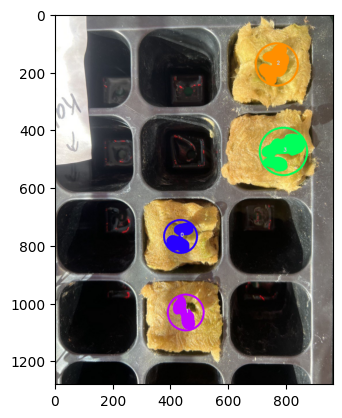

In [65]:
cluster_img = pcv.visualize.clustered_contours(img=img, grouped_contour_indices=clusters_i, 
                                                roi_objects=contours,
                                                roi_obj_hierarchy=hierarchies)

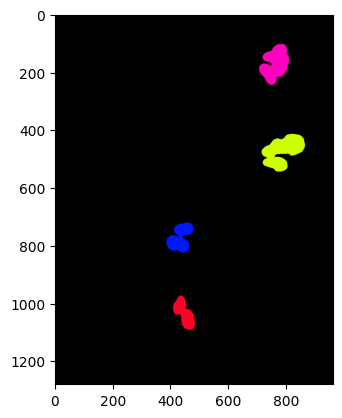

In [66]:
clust_img, clust_masks = pcv.spatial_clustering(mask=kept_mask, algorithm="DBSCAN", min_cluster_size=4, max_distance=None)


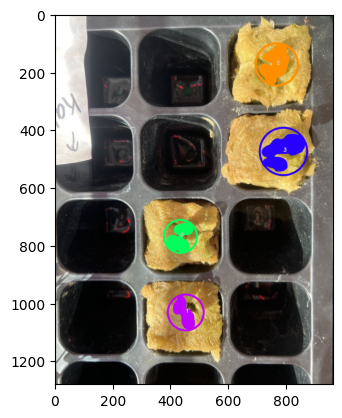

In [67]:
pcv.params.color_sequence = 'random'
cluster_img = pcv.visualize.clustered_contours(img=img, grouped_contour_indices=clusters_i, 
                                                roi_objects=contours,
                                                roi_obj_hierarchy=hierarchies)

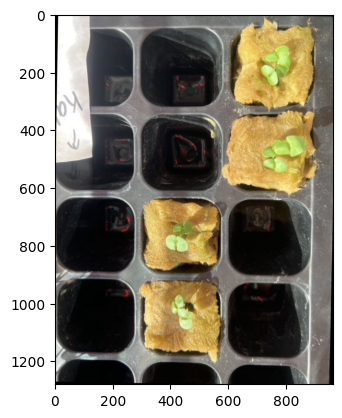

In [68]:
rotate_img = pcv.transform.rotate(img=img, rotation_deg=-1, crop=True)

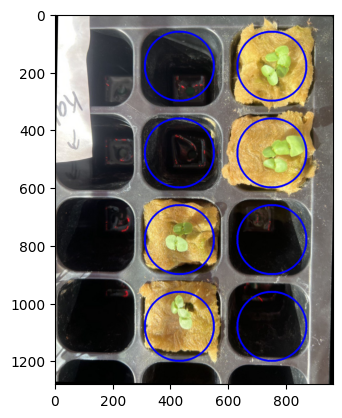

In [69]:
rois1, roi_hierarchy1 = pcv.roi.multi(img=rotate_img, coord=(430,180), radius=120, spacing=(320, 300), nrows=4, ncols=2)


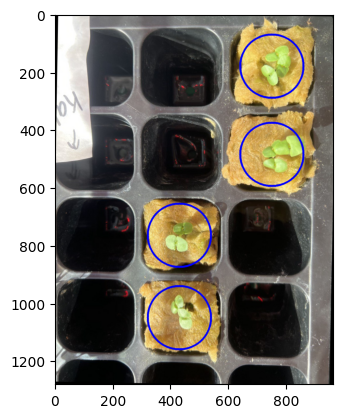

In [70]:
rois2, roi_hierarchy2 = pcv.roi.multi(img=rotate_img, coord=[(430,765), (430,1050), (750, 180), (750, 485)], radius=110)

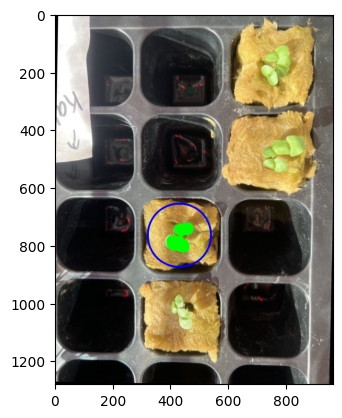

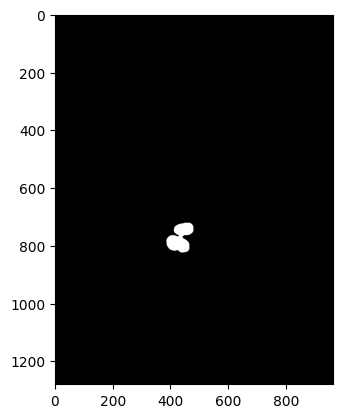

In [71]:
roi = rois2[0]
hierarchy = roi_hierarchy2[0]

filtered_contours, filtered_hierarchy, filtered_mask, filtered_area = pcv.roi_objects(
        img=rotate_img, roi_type="partial", roi_contour=roi, roi_hierarchy=hierarchy, object_contour=roi_objects, 
        obj_hierarchy=roi_obj_hierarchy)

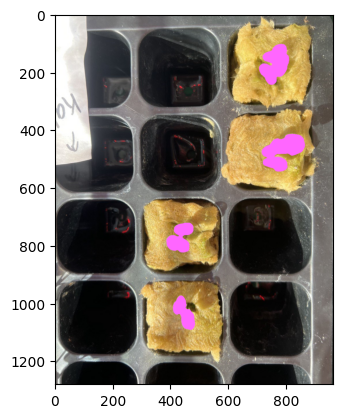

In [72]:
id_objects, obj_hierarchy = pcv.find_objects(img=img, mask=dilated)

In [75]:
len(id_objects)

4

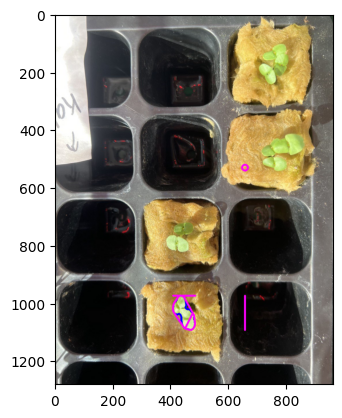

IndexError: list index out of range

In [85]:
for i in ["00", "11", "22", "33"]:
    img_copy = pcv.analyze_object(img=img, obj=id_objects[int(i)], mask=dilated, label="i")

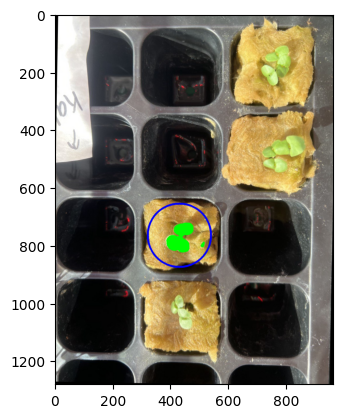

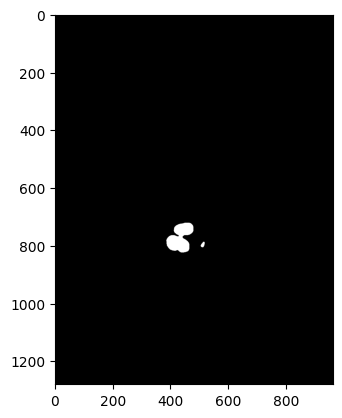

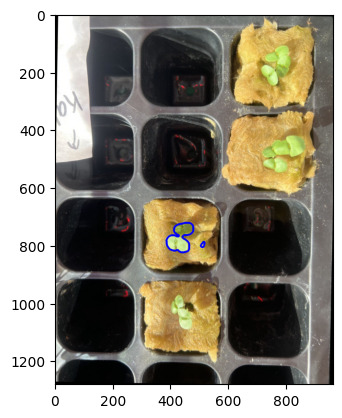

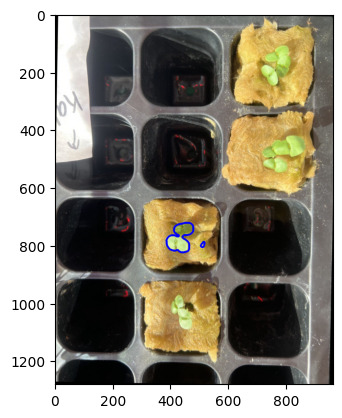

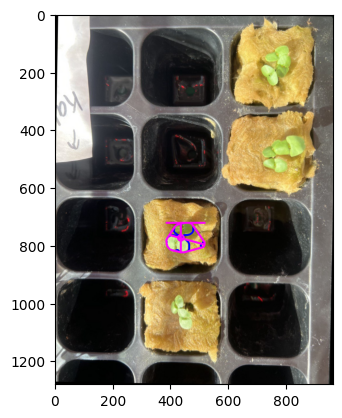

...

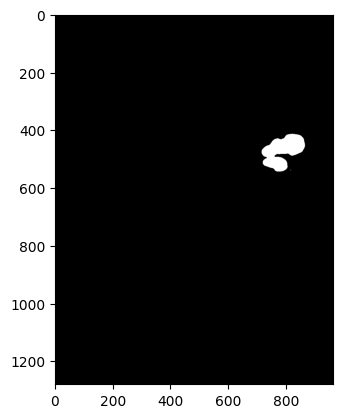

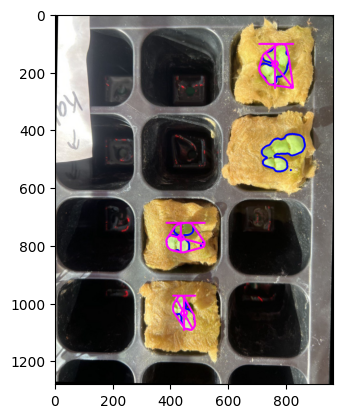

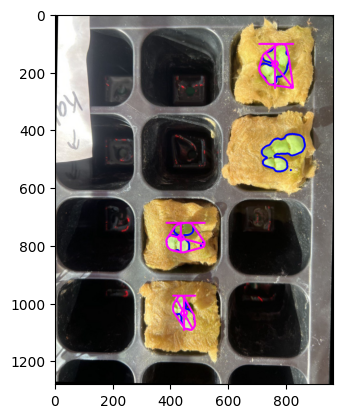

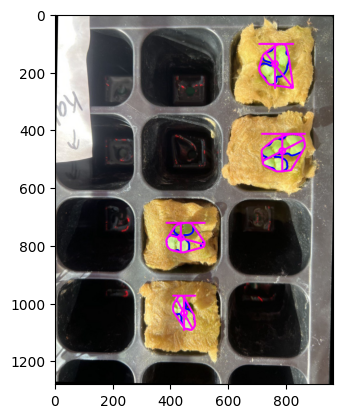

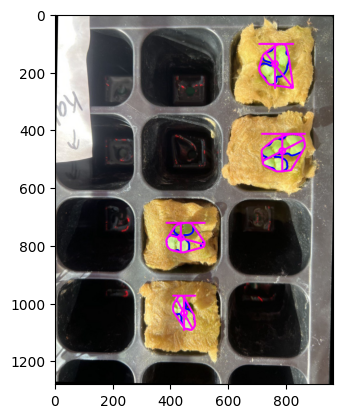

In [43]:
import numpy as np

img_copy = np.copy(rotate_img)

for i in range(0, len(rois2)):
    roi = rois2[i]
    hierarchy = roi_hierarchy2[i]
    # Filter objects by ROI 
    filtered_contours, filtered_hierarchy, filtered_mask, filtered_area = pcv.roi_objects(
        img=rotate_img, roi_type="partial", roi_contour=roi, roi_hierarchy=hierarchy, object_contour=roi_objects, 
        obj_hierarchy=roi_obj_hierarchy)

    # Combine objects together in each plant     
    plant_contour, plant_mask = pcv.object_composition(img=img_copy, contours=filtered_contours, hierarchy=filtered_hierarchy)        

    # Analyze the shape of each plant 
    img_copy = pcv.analyze_object(img=img_copy, obj=plant_contour, mask=plant_mask, label=str(i))

# The save results function will take the measurements stored when running any PlantCV analysis functions, format, 
# and print an output text file for data analysis. The Outputs class stores data whenever any of the following functions
# are ran: analyze_bound_horizontal, analyze_bound_vertical, analyze_color, analyze_nir_intensity, analyze_object, 
# fluor_fvfm, report_size_marker_area, watershed. If no functions have been run, it will print an empty text file 
pcv.outputs.save_results(filename=args.result)

# Plot out the image with shape analysis on each plant in the image 
pcv.plot_image(img_copy)

In [53]:

import json

f = open("vis_tutorial_results.json")
data = json.load(f)

assert ["default", "0", "1", "2", "3"] == list(data["observations"].keys())
plant_area = {}
for plant in ["0", "1", "2", "3"]:
    plant_area[plant] = data["observations"][plant]["area"]["value"]
f.close()
plant_area

{'0': 6330.0, '1': 5004.0, '2': 9423.0, '3': 11371.0}

In [87]:

import json

f = open("test1.json")
data = json.load(f)

#assert ["default", "0", "1", "2", "3"] == list(data["observations"].keys())
plant_area = {}
for plant in ["00", "11", "22", "33"]:
    plant_area[plant] = data["observations"][plant]["area"]["value"]
f.close()
plant_area

KeyError: '00'

In [88]:
pcv.outputs.save_results(filename="test1.json")

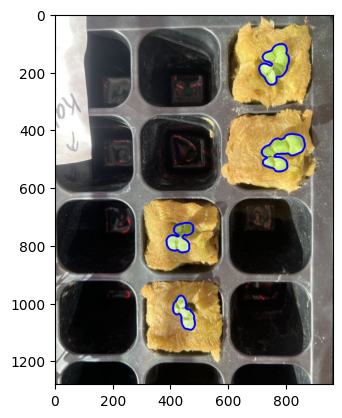

In [113]:
roi_contour, roi_hierarchy = pcv.roi.from_binary_image(img=img, bin_img=dilated)

In [ ]:
pcv.ob

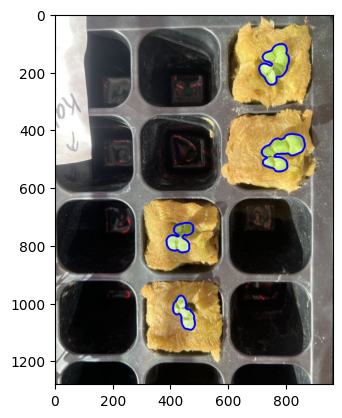

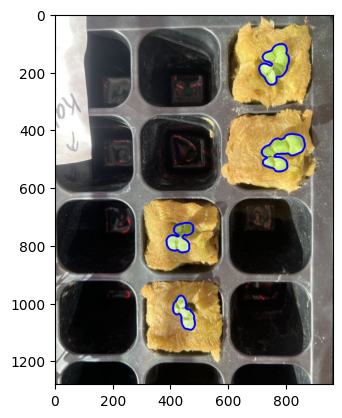

In [118]:
obj, mask = pcv.object_composition(img, roi_objects, roi_hierarchy)

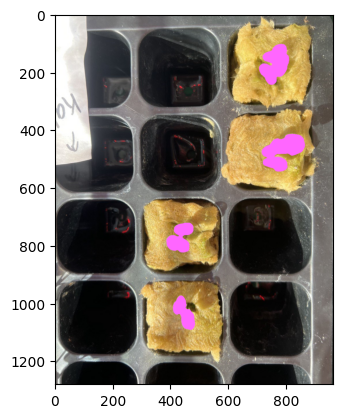

In [125]:
id_objects, obj_hierarchy = pcv.find_objects(img=img, mask=dilated)

In [136]:
pcv.outputs.observations["default"]["area"]

{'trait': 'area',
 'method': 'plantcv.plantcv.analyze_object',
 'scale': 'pixels',
 'datatype': "<class 'int'>",
 'value': 31888.0,
 'label': 'pixels'}

In [ ]:
id_objects, obj_hierarchy = pcv.find_objects(img=img, mask=dilated)

In [164]:
xs = [p[0][0] for p in roi_contour[3]]
ys = [p[0][1] for p in roi_contour[3]]

In [153]:
roi_contour[0][0][0][0]

432

In [165]:
def PolyArea(x,y):
    return 0.5*np.abs(np.dot(x,np.roll(y,1))-np.dot(y,np.roll(x,1)))


In [166]:
PolyArea(xs, ys)

9166.5

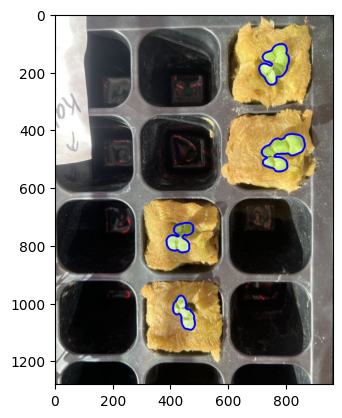

In [149]:
roi_contour, roi_hierarchy = pcv.roi.from_binary_image(img=img, bin_img=dilated)

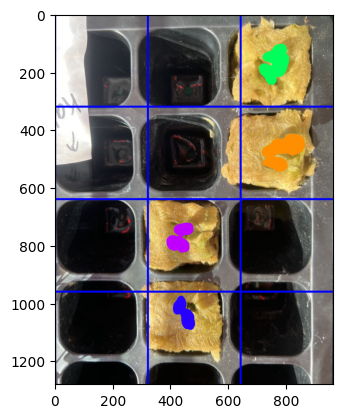

In [143]:
clusters_i, contours, hierarchies = pcv.cluster_contours(img=img, roi_objects=roi_objects, 
                                                         roi_obj_hierarchy=obj_hierarchy, 
                                                         nrow=4, ncol=3, 
                                                         show_grid=True)

In [ ]:
import numpy as np

img_copy = np.copy(rotate_img)

for i in range(0, len(rois2)):
    roi = rois2[i]
    hierarchy = roi_hierarchy2[i]
    # Filter objects by ROI 
    filtered_contours, filtered_hierarchy, filtered_mask, filtered_area = pcv.roi_objects(
        img=rotate_img, roi_type="partial", roi_contour=roi, roi_hierarchy=hierarchy, object_contour=roi_objects, 
        obj_hierarchy=roi_obj_hierarchy)

    # Combine objects together in each plant     
    plant_contour, plant_mask = pcv.object_composition(img=img_copy, contours=filtered_contours, hierarchy=filtered_hierarchy)        

    # Analyze the shape of each plant 
    img_copy = pcv.analyze_object(img=img_copy, obj=plant_contour, mask=plant_mask, label=str(i))

# The save results function will take the measurements stored when running any PlantCV analysis functions, format, 
# and print an output text file for data analysis. The Outputs class stores data whenever any of the following functions
# are ran: analyze_bound_horizontal, analyze_bound_vertical, analyze_color, analyze_nir_intensity, analyze_object, 
# fluor_fvfm, report_size_marker_area, watershed. If no functions have been run, it will print an empty text file 
pcv.outputs.save_results(filename=args.result)

# Plot out the image with shape analysis on each plant in the image 
pcv.plot_image(img_copy)

In [145]:
clusters_i

[[1], [0], [3], [2]]

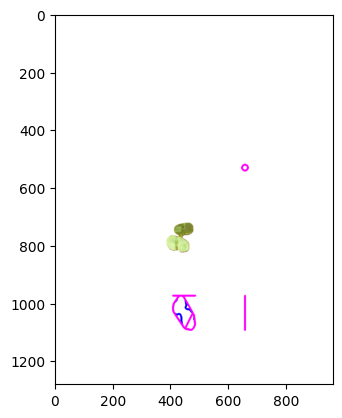

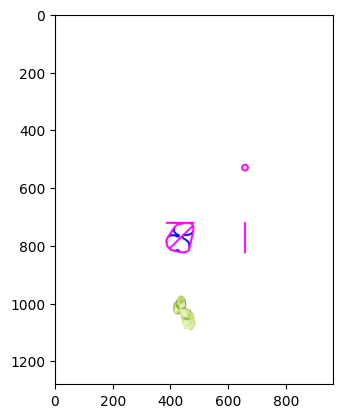

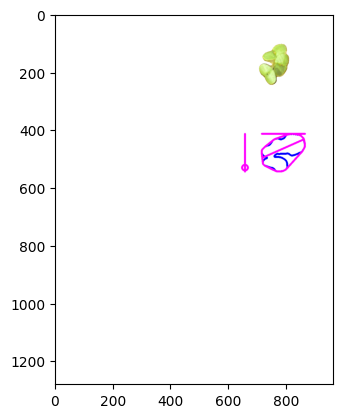

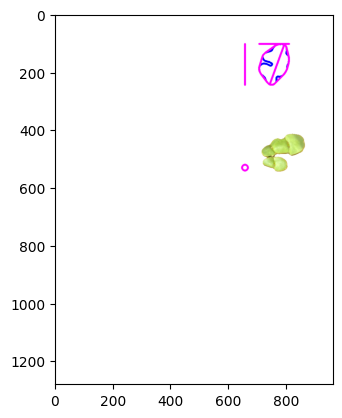

In [148]:
for i in range(len(clusters_i)):
    img_copy = pcv.analyze_object(img=imgs[i], obj=contours[i], mask=dilated, label=str(i))

This function has been updated to include object hierarchy so object holes can be included


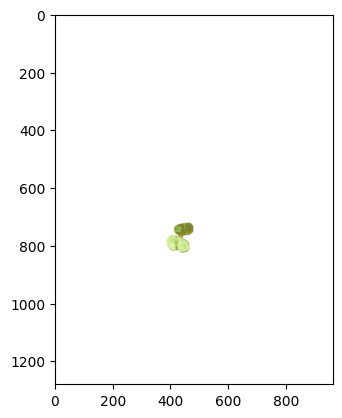

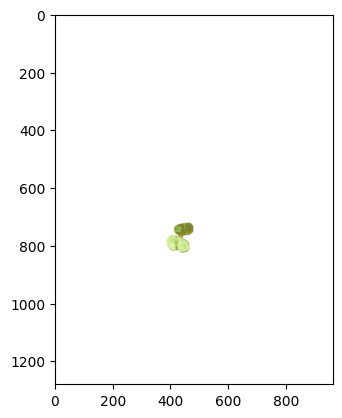

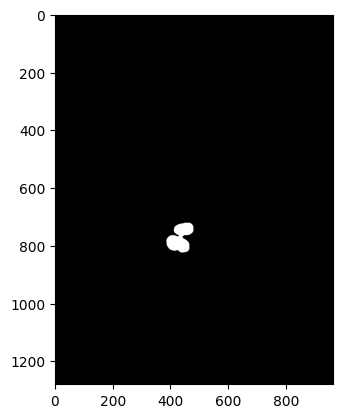

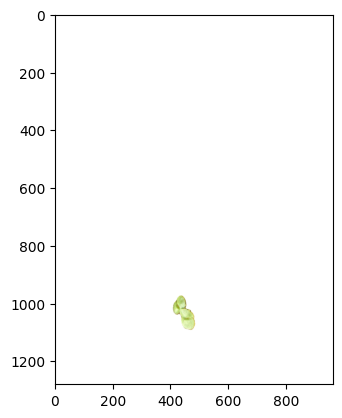

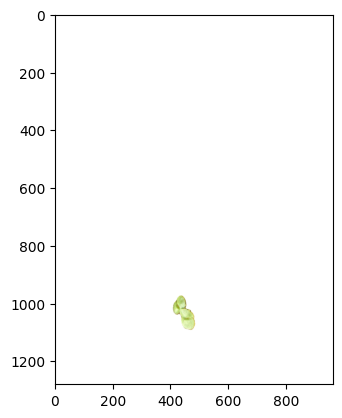

...

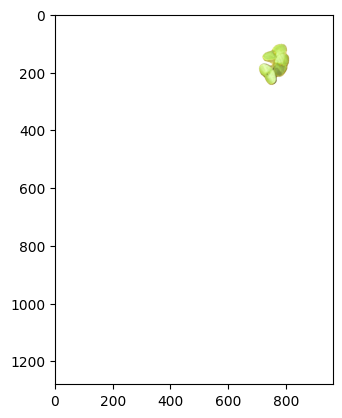

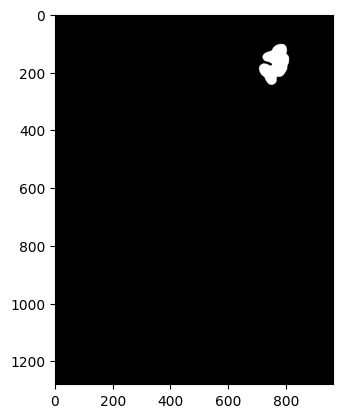

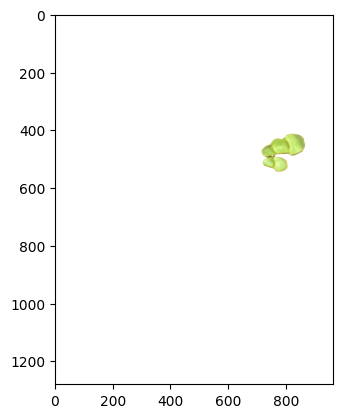

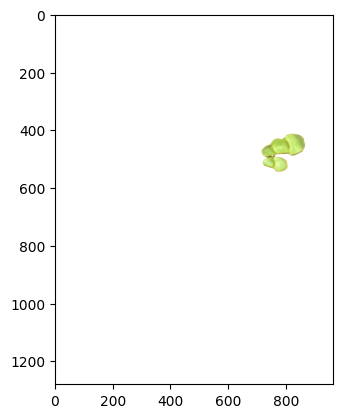

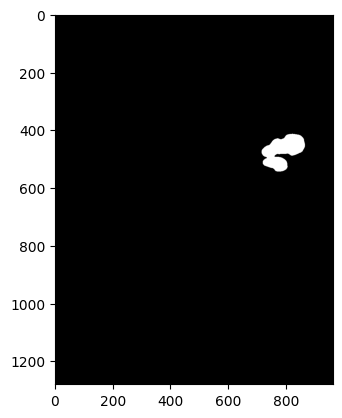

In [147]:
output_path, imgs, masks = pcv.cluster_contour_splitimg(img, clusters_i, contours, 
                                                        hierarchies, 
                                                        filenames=None)


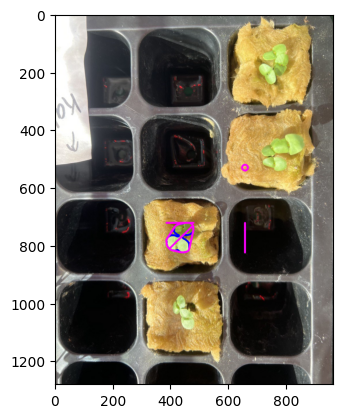

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 41,  58,  44],
        [ 44,  59,  45],
        [ 44,  60,  43]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 41,  58,  44],
        [ 44,  60,  43],
        [ 44,  60,  43]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [ 41,  58,  44],
        [ 44,  60,  43],
        [ 44,  60,  43]],

       ...,

       [[ 83,  90,  93],
        [ 85,  92,  95],
        [ 90,  95,  98],
        ...,
        [ 39,  42,  40],
        [ 39,  45,  40],
        [ 39,  45,  40]],

       [[ 81,  88,  91],
        [ 83,  90,  93],
        [ 89,  94,  97],
        ...,
        [ 40,  43,  41],
        [ 39,  45,  40],
        [ 39,  45,  40]],

       [[ 80,  87,  90],
        [ 82,  89,  92],
        [ 89,  94,  97],
        ...,
        [ 43,  46,  44],
        [ 40,  46,  41],
        [ 40,  46,  41]]

In [135]:
pcv.analyze_object(img=img, obj=id_objects[1], mask=mask)


In [122]:
a = pcv.analyze_object(img=img_copy, obj=obj[0], mask=mask, label="test")

In [ ]:
roi_contour, roi_hierarchy = pcv.roi.from_binary_image(img=img, bin_img=dilated)

In [117]:
obj, mask = pcv.object_composition(img, roi_contour[0])

TypeError: object_composition() missing 1 required positional argument: 'hierarchy'

In [114]:
contours = roi_contour
for i in range(0, len(contours)):
    roi = contours[i]
    hierarchy = roi_hierarchy[i]
    obj, mask = pcv.object_composition(img, roi, hierarchy)
    # Analyze the shape of each plant 
    pcv.analyze_object(img=img_copy, obj=obj, mask=mask, label=str(i))


IndexError: invalid index to scalar variable.